## Advanced Lane Finding Project
The goals / steps of this project are the following:
- Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
- Apply a distortion correction to raw images.
- Use color transforms, gradients, etc., to create a thresholded binary image.
- Apply a perspective transform to rectify binary image ("birds-eye view").
- Detect lane pixels and fit to find the lane boundary.
- Determine the curvature of the lane and vehicle position with respect to center.
- Warp the detected lane boundaries back onto the original image.
- Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Compute Camera Calibration using Chessboard Images

Images ['camera_cal/calibration1.jpg', 'camera_cal/calibration10.jpg', 'camera_cal/calibration11.jpg', 'camera_cal/calibration12.jpg', 'camera_cal/calibration13.jpg', 'camera_cal/calibration14.jpg', 'camera_cal/calibration15.jpg', 'camera_cal/calibration16.jpg', 'camera_cal/calibration17.jpg', 'camera_cal/calibration18.jpg', 'camera_cal/calibration19.jpg', 'camera_cal/calibration2.jpg', 'camera_cal/calibration20.jpg', 'camera_cal/calibration3.jpg', 'camera_cal/calibration4.jpg', 'camera_cal/calibration5.jpg', 'camera_cal/calibration6.jpg', 'camera_cal/calibration7.jpg', 'camera_cal/calibration8.jpg', 'camera_cal/calibration9.jpg']


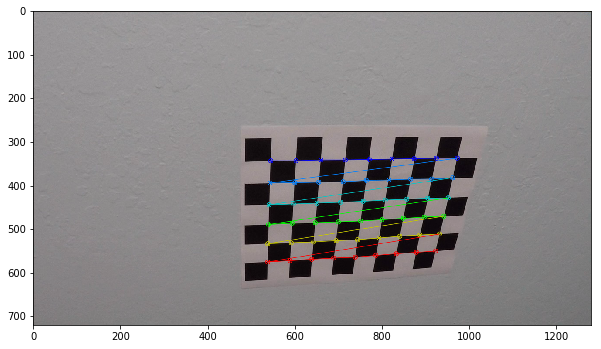

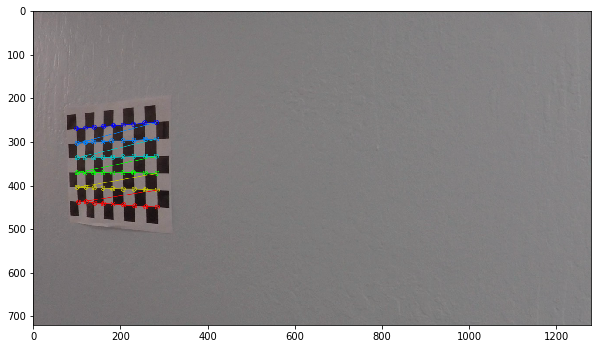

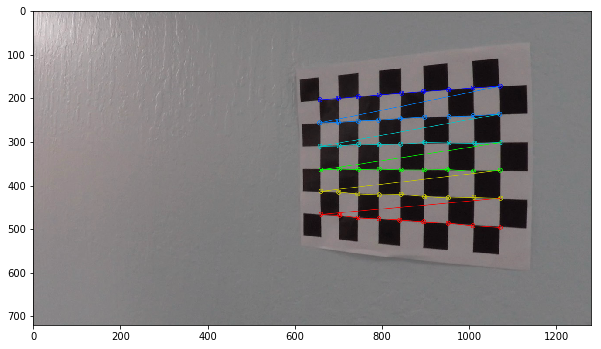

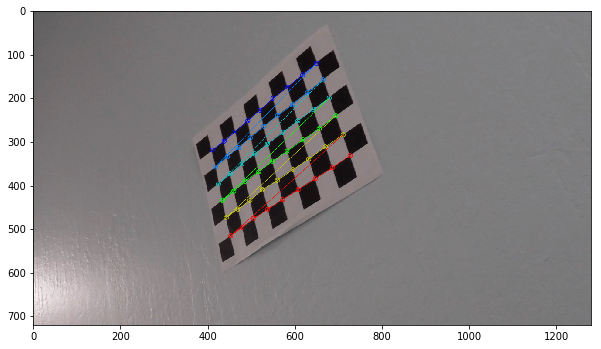

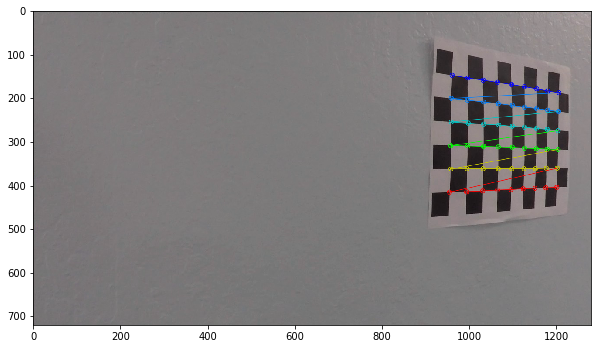

...

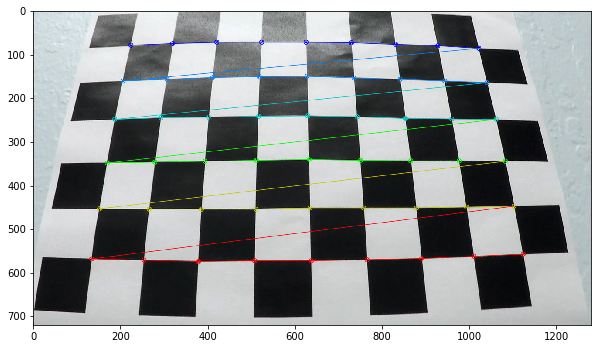

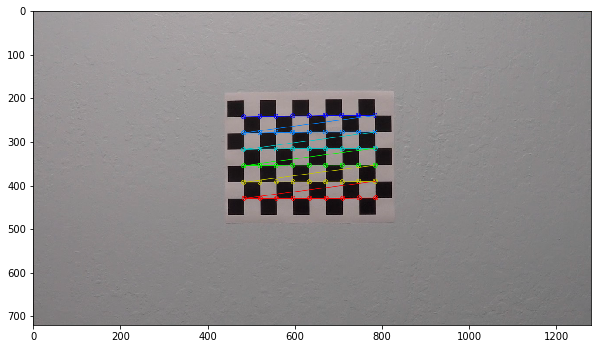

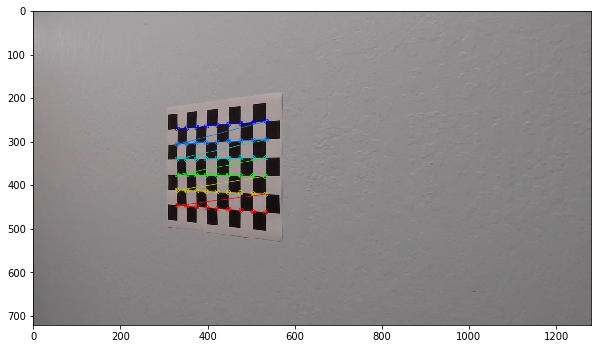

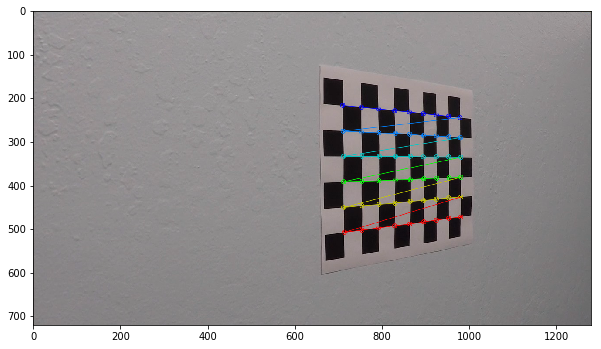

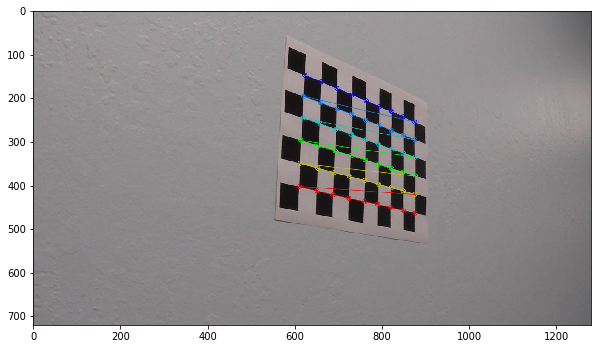

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10,10)


CAMERA_CALIB_FILE = 'camera_calibration.p'

#%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
# grid represenatation
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

print ("Images", images)

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.imshow(img)
        plt.show()
    
        


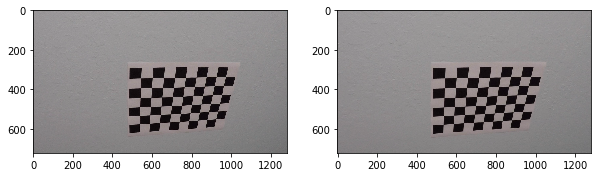

In [2]:
import pickle

# grab an image for testing
orig = cv2.imread(images[2])
img = test_img = cv2.imread(images[1])
img_size = (img.shape[1], img.shape[0])

# camera calibration with object points and image points extracted in previous cell
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

undist_image = cv2.undistort(img, mtx, dist, None, mtx)

plt.subplot(121)
plt.imshow(img)
plt.subplot(122)
plt.imshow(undist_image)
plt.show()

# save pickled dictionary with camera calibration information

camera_calibration_data = {"matrix" : mtx,
                           "distortion" : dist,
                           "rotation" : rvecs,     # not used in project
                           "translation" : tvecs}  # not used in project
# save to file for later reuse
with open(CAMERA_CALIB_FILE, 'wb') as f:
    pickle.dump(camera_calibration_data, f)



## Load in test images and develop pipleline


 ## Thresholding Helper Functions 

In [3]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def abs_sobel_threshold(image, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Apply the following steps to img
    # 1) Take the derivative in x or y given orient = 'x' or 'y'
    # 2) Take the absolute value of the derivative or gradient
    # 3) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 4) Create a mask of 1's where the scaled gradient magnitude 
    # is > thresh_min and < thresh_max
    # 5) Return this mask as your binary_output image
    
    if orient == 'x':
        sobel = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize = sobel_kernel,  )
    else:
        sobel = cv2.Sobel(image, cv2.CV_65F, 0, 1, ksize = sobel_kernel, )
    
    # cleanup derivative for display
    sobel = abs(sobel)
    sobel = np.uint8(255*sobel / np.max(sobel))
    binary_output = np.zeros_like(sobel)
    binary_output[(sobel >= thresh[0]) & (sobel <= thresh[1])] = 1
    
    return binary_output

def mag_threshold(image, sobel_kernel=3, thresh=(0, 255)):
    # Apply the following steps to img
    # 1) Take the gradient in x and y separately
    # 2) Calculate the magnitude 
    # 3) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 4) Create a binary mask where mag thresholds are met
    # 5) Return this mask as your binary_output image
    
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize = sobel_kernel)

    abs_sobelxy = np.sqrt(sobelx**2 + sobely**2)
    
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return binary_output

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Apply the following steps to img
    # 1) Take the gradient in x and y separately
    # 2) Take the absolute value of the x and y gradients
    # 3) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # 4) Create a binary mask where direction thresholds are met
    # 5) Return this mask as your binary_output image
    
    sobelx = np.abs(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize = sobel_kernel)) 
    sobely = np.abs(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize = sobel_kernel))
    gradient_dir = np.arctan2(sobely, sobelx)
    
    binary_output = np.zeros_like(gradient_dir)
    binary_output[(gradient_dir >= thresh[0]) & (gradient_dir <= thresh[1])] = 1

    return binary_output

def color_threshold(image, thresh = (0, 255)):
    # applies a simple color (value) thresholding to the image
    binary_output = np.zeros_like(image)
    binary_output[(image >= thresh[0]) & (image <= thresh[1])] = 1
    return binary_output

def combine_binary_and(img_a, img_b):
    # combine (AND) two binary images and output results
    binary_output_combined = np.zeros_like(img_a)
    
    binary_output_combined[(img_a == 1) & (img_b == 1)] = 1
    
    return binary_output_combined

def combine_binary_or(img_a, img_b):
    # combine (AND) two binary images and output results
    binary_output_combined = np.zeros_like(img_a)
    
    binary_output_combined[(img_a == 1) | (img_b == 1)] = 1
    
    return binary_output_combined

    

## Sliding Window Search Algorithm

Inspired by slide 34 in the Advanced Lane Finding Project Page.

In [12]:
def window_mask(width, height, img_ref, center,level):
    '''masking function --> draws window areas'''
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),
           max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def window_filter(img_ref, mask, width, height, center, level):
    '''selects pixels from mask'''
    
    y_start = int(img_ref.shape[0]-(level+1)*height)
    y_end = int(img_ref.shape[0]-level*height)
    
    x_start = max(0,int(center-width/2))
    x_end =  min(int(center+width/2),img_ref.shape[1])
    
    mask_roi = mask[y_start: y_end, x_start : x_end]
        
    white_pixels = img_ref[y_start: y_end, 
                   x_start : x_end] == 1 
    
    mask_roi[white_pixels] = 1 
    
    
    return mask
    

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(image.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(image.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(image[int(image.shape[0]-(level+1)*window_height):int(image.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,image.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,image.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        
        #print (level, conv_signal[int(r_center)], conv_signal[int(l_center)])
        
        ## if there is no signal, keep the previous centriod, to avoid centroids drifting to the side
        
        previous_centroid = window_centroids[-1]
        
        if conv_signal[int(r_center)] == 0:
            r_center = previous_centroid[1]
        
        if conv_signal[int(l_center)] == 0:
            l_center = previous_centroid[0]
        
        window_centroids.append((l_center,r_center))

    return window_centroids

def sliding_window_search(warped, window_width = 50, window_height = 80, margin = 100):
    
    window_centroids = find_window_centroids(warped, window_width, window_height, margin)
    
    # holds filter pixels using centroid mask
    filtered_pixels_l = np.zeros_like(warped)
    filtered_pixels_r = np.zeros_like(warped)
    
    
    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)
        
        l_filter_points = np.zeros_like(warped)
        r_filter_points = np.zeros_like(warped)

        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255
            
            ####### filter out image pixels in the windows on left and on right 
            
            filtered_pixels_r = window_filter(warped,
                                            filtered_pixels_r,
                                            window_width, 
                                            window_height, 
                                            window_centroids[level][1], 
                                            level)
            
            filtered_pixels_l = window_filter(warped,
                                            filtered_pixels_l,
                                            window_width, 
                                            window_height, 
                                            window_centroids[level][0], 
                                            level)
            
            #plt.imshow(filtered_pixels)
            #plt.show()
            
            
            
            #######

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage= np.dstack((warped, warped, warped))*255 # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    
    #print (window_centroids)
    
    return output, filtered_pixels_l, filtered_pixels_r, window_centroids
    
    
    

### Polynomial Fitting and Visualization

Functions for fitting polynomial to image pixels, visualization and calculating real-world curvature.

In [117]:
def fit_poly(image):
    '''fit polynomial to pixels in image and determine curvature radius'''
    
 
    
    ## find indices of nonzero pixels
    y,x = np.where(image > 0)
    
    # fit 2nd order poly
    p_fit_y = np.polyfit(y,x, 2)
    
    #### provide a plot output
    ## y pixels to plot
    ploty = np.linspace(0, 719, num=720)
    y_eval = np.max(ploty)
    
    ## get x coordinates by mapping polynomial p_fit_y
    fit_x = p_fit_y[0] * ploty**2 + p_fit_y[1] * ploty + p_fit_y[2]
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    p_fit_y_cr = np.polyfit(y*ym_per_pix, x*xm_per_pix, 2)
    curve_rad = ((1 + (2*p_fit_y_cr[0]*y_eval*ym_per_pix + p_fit_y_cr[1])**2)**1.5) / np.absolute(2*p_fit_y_cr[0])
    
    
    return (ploty, fit_x), curve_rad

def draw_poly(image, coords):
    '''coords = y, x with y and x a list of indices for y resp. x coordinates'''
    h,w,_ = image.shape
    
    y,x = coords
    
    print (y.shape, x.shape)
    
    
    

    #print (" ==== COORDS ==== ")
    #for c in coords:
    #    print (c)

    y = np.int32(y)
    x = np.int32(x)

    # normalize coordinates that can't be drawn
    x = np.minimum(x, w-1)
    x = np.maximum(0,x)
    
    coords = np.int32([i for i in zip(x,y)])
    image = cv2.polylines(image, [coords], 0, (255,255,0), thickness=4)

 
    return image

def draw_poly_filled(image, coords_l, coords_r):
    ''' draws filled polygon from left / right lane line fits'''
    y_l,x_l = coords_l
    
    y_r,x_r = coords_r
    
    ### reverse right poly fit so that we get a closed polygon for drawing
    y_r = y_r[::-1]
    x_r = x_r[::-1]
    
    y = np.hstack((y_l,y_r))
    x = np.hstack((x_l, x_r))
    
    print(y_r.shape, y.shape)
    
    coords = np.int32([i for i in zip(x,y)])
    
    image = cv2.fillPoly(image, [coords], (0,255,0))

    return image
    



        
    
    
    
    

## Main Processing Pipeline Script

Masked Image and perspective transform (rectification)
Histogram Analysis
(720,) (720,)
(720,) (720,)
Sliding window search results
(720,) (720,)
(720,) (720,)
(720,) (1440,)
Final Result
Image Undistortion


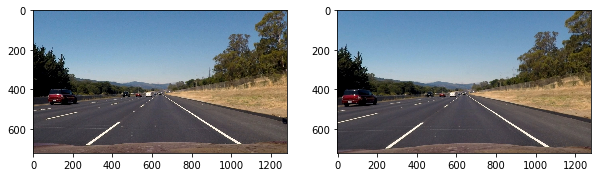

HLS Separation


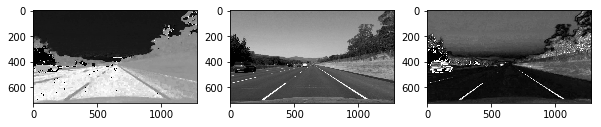

Sobel, Gradient Magn and Gradient Dir and combined 1


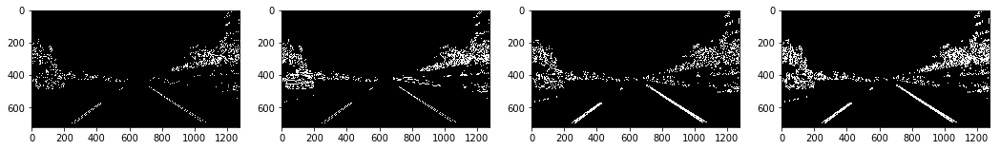

Masked Image and perspective transform (rectification)


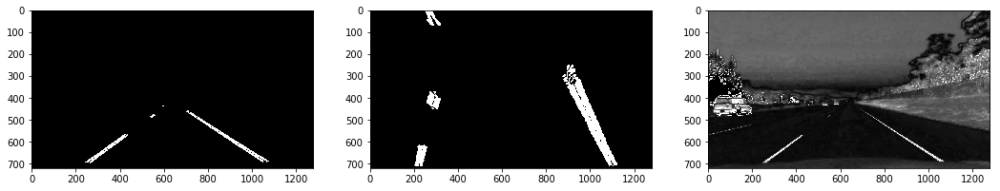

Histogram Analysis
(720,) (720,)
(720,) (720,)
Sliding window search results


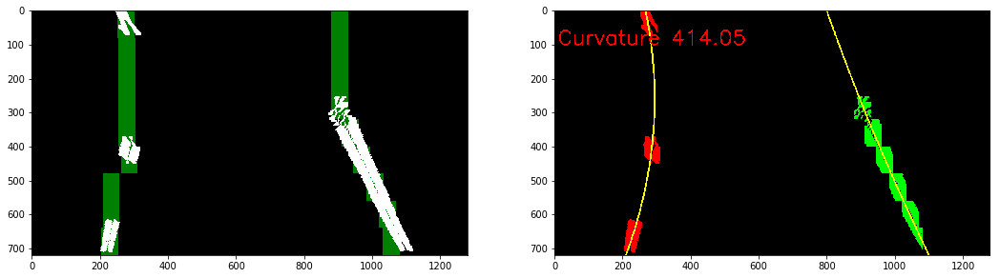

(720,) (720,)
(720,) (720,)
(720,) (1440,)
Final Result


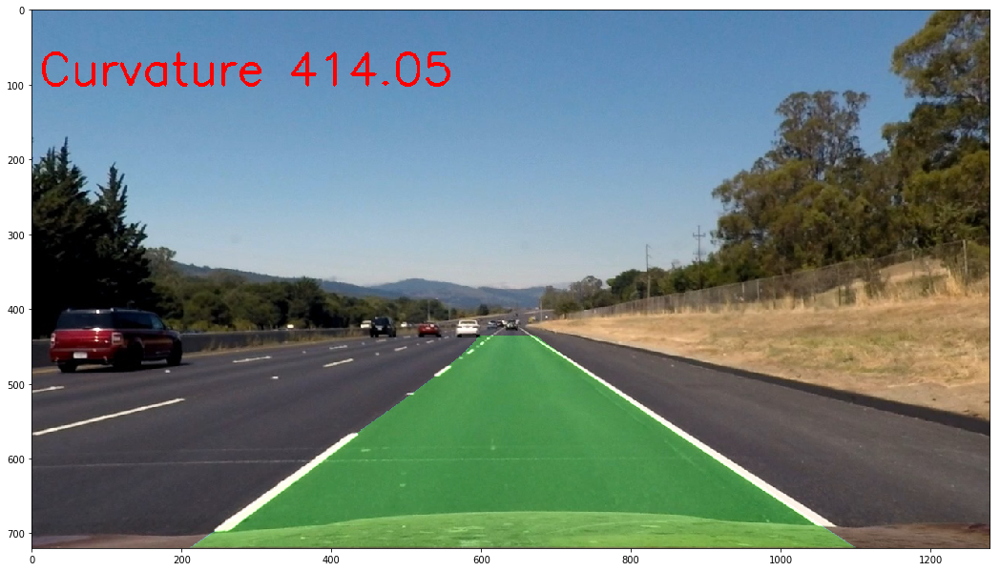

Image Undistortion


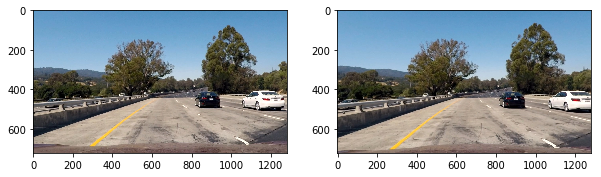

HLS Separation


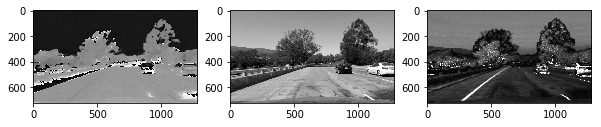

Sobel, Gradient Magn and Gradient Dir and combined 2


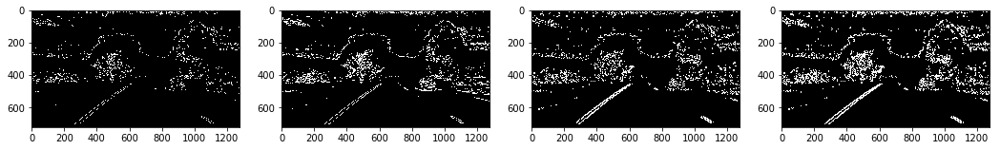

Masked Image and perspective transform (rectification)


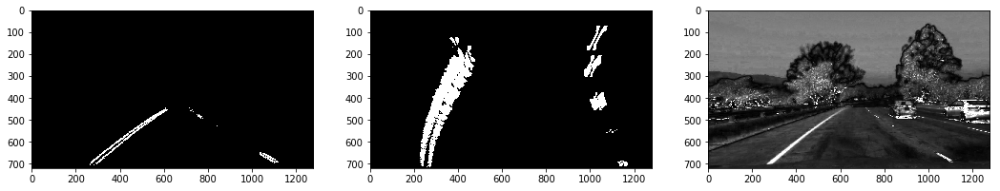

Histogram Analysis
(720,) (720,)
(720,) (720,)
Sliding window search results


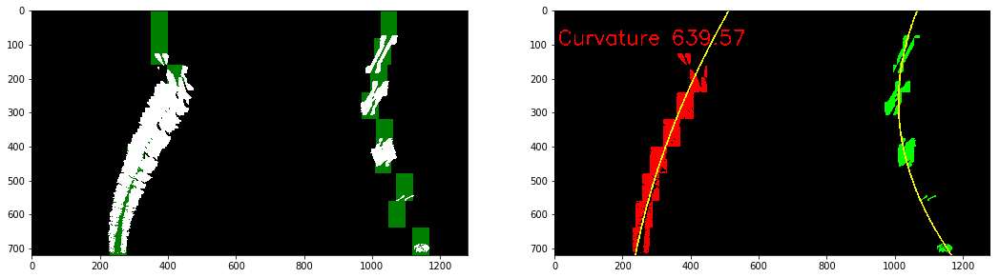

(720,) (720,)
(720,) (720,)
(720,) (1440,)
Final Result


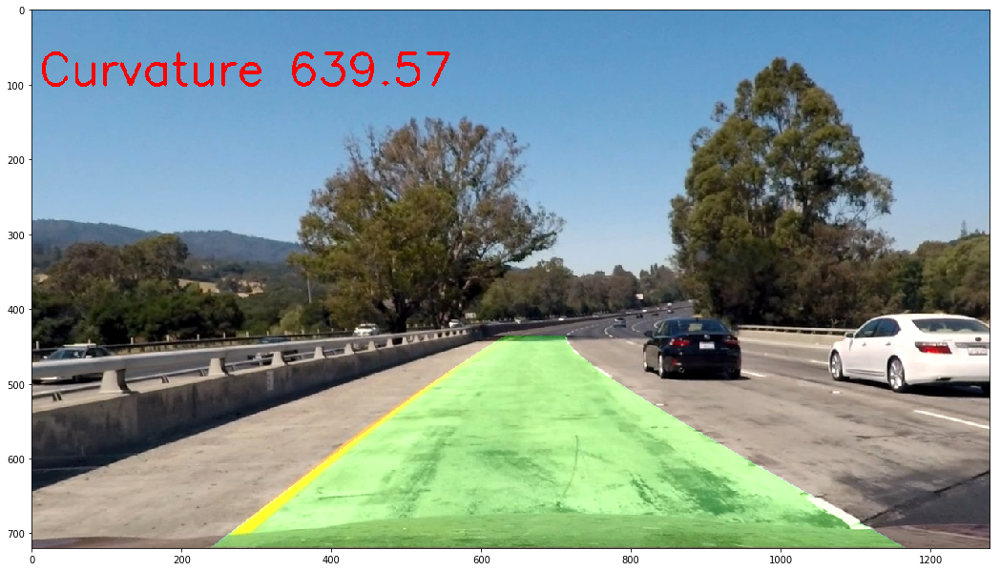

Image Undistortion


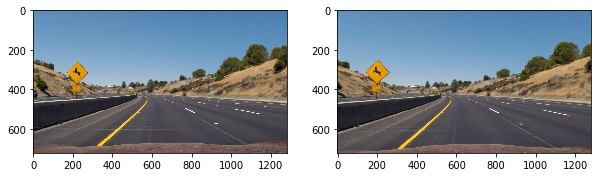

HLS Separation


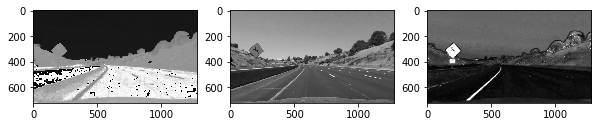

Sobel, Gradient Magn and Gradient Dir and combined 3


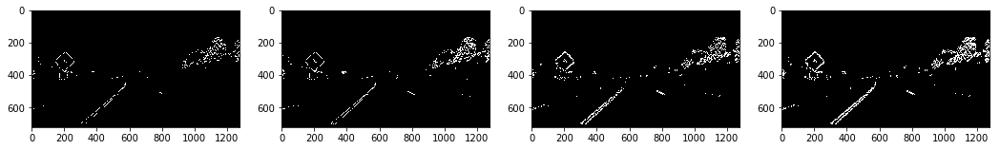

Masked Image and perspective transform (rectification)


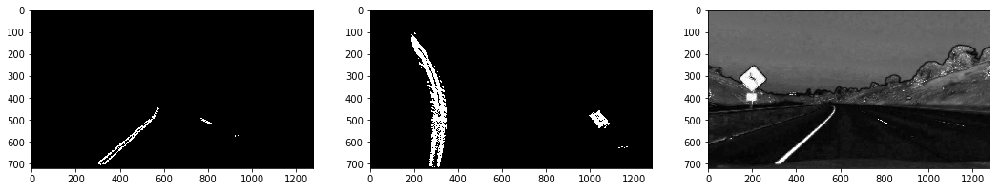

Histogram Analysis
(720,) (720,)
(720,) (720,)
Sliding window search results


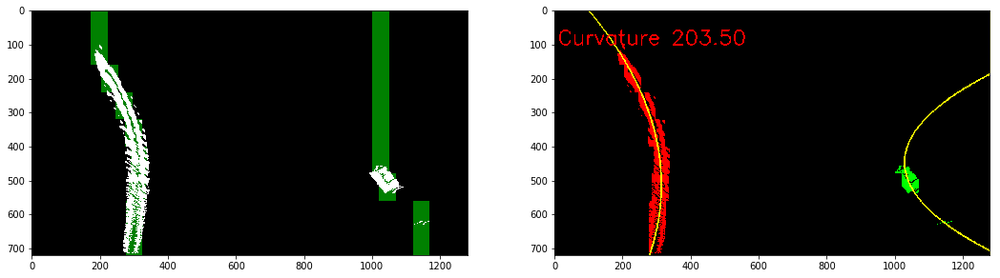

(720,) (720,)
(720,) (720,)
(720,) (1440,)
Final Result


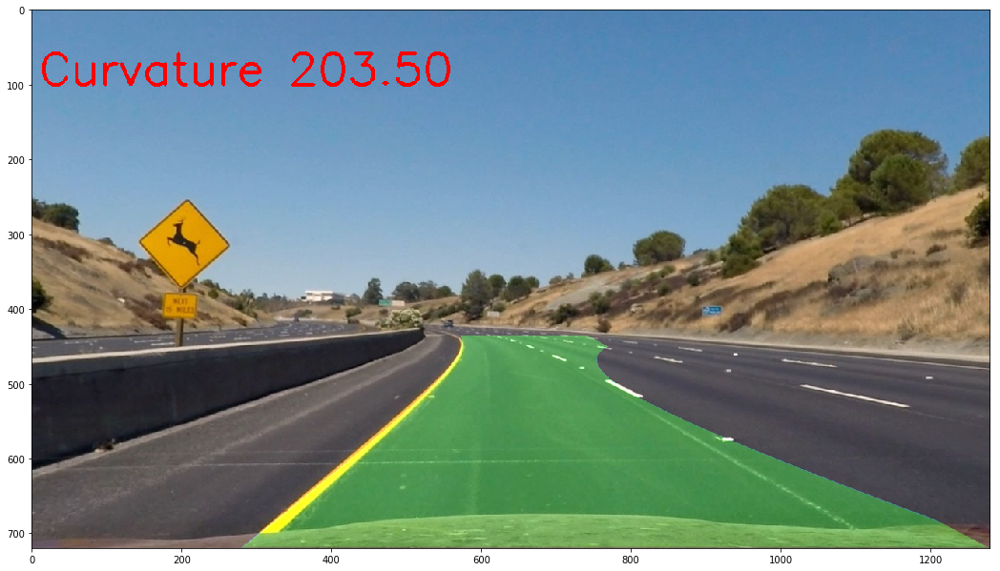

Image Undistortion


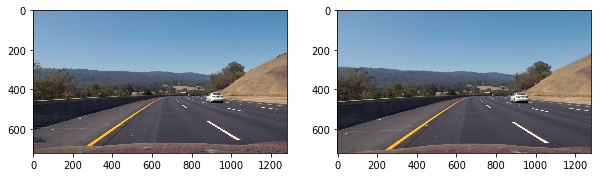

HLS Separation


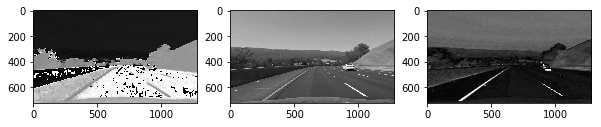

Sobel, Gradient Magn and Gradient Dir and combined 4


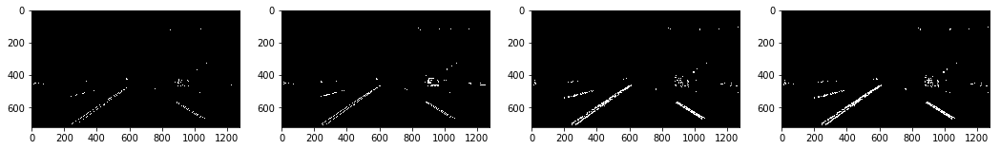

Masked Image and perspective transform (rectification)


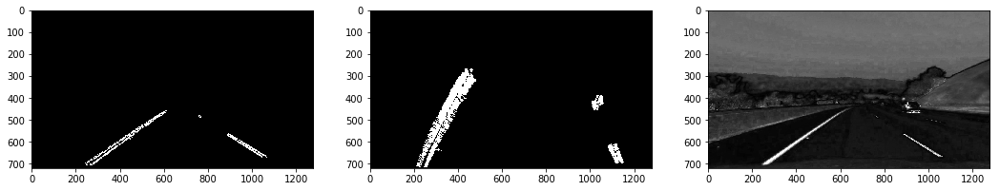

Histogram Analysis
(720,) (720,)
(720,) (720,)
Sliding window search results


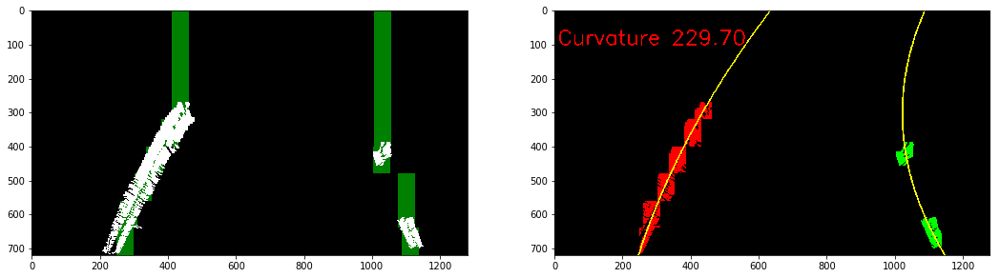

(720,) (720,)
(720,) (720,)
(720,) (1440,)
Final Result


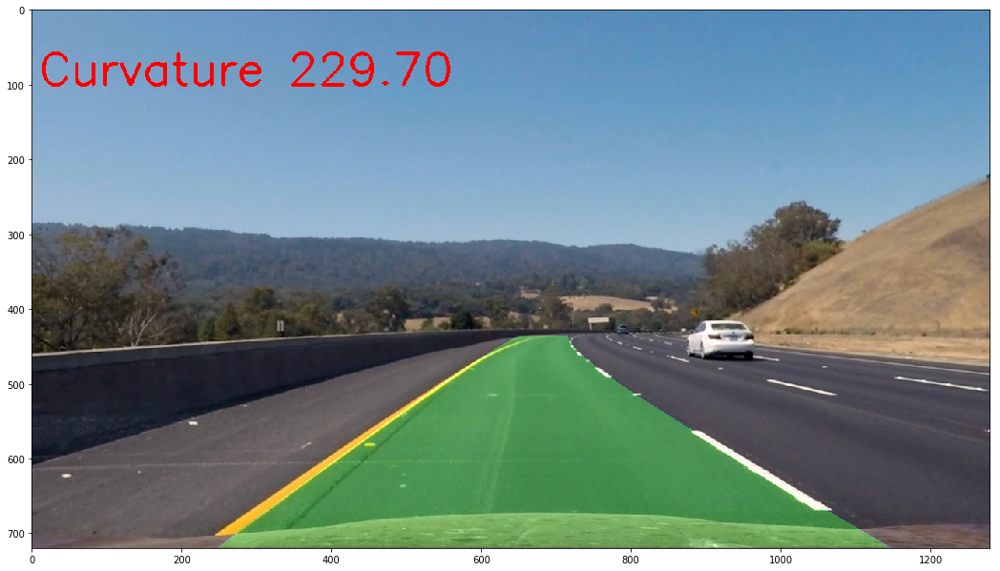

Image Undistortion


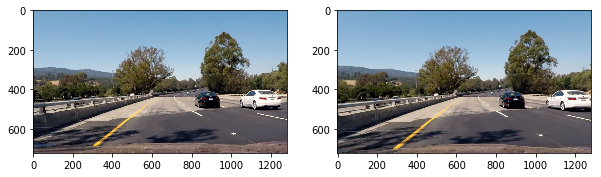

HLS Separation


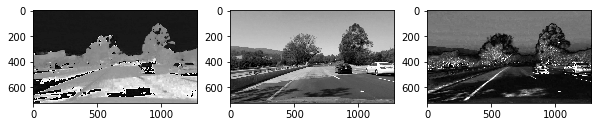

Sobel, Gradient Magn and Gradient Dir and combined 5


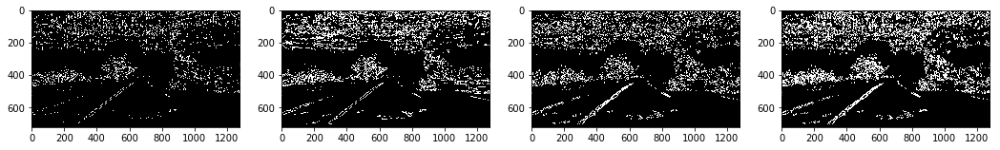

Masked Image and perspective transform (rectification)


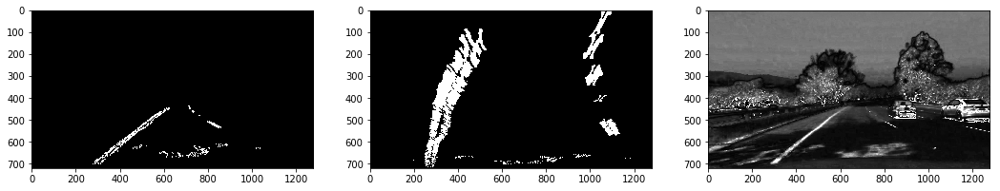

Histogram Analysis
(720,) (720,)
(720,) (720,)
Sliding window search results


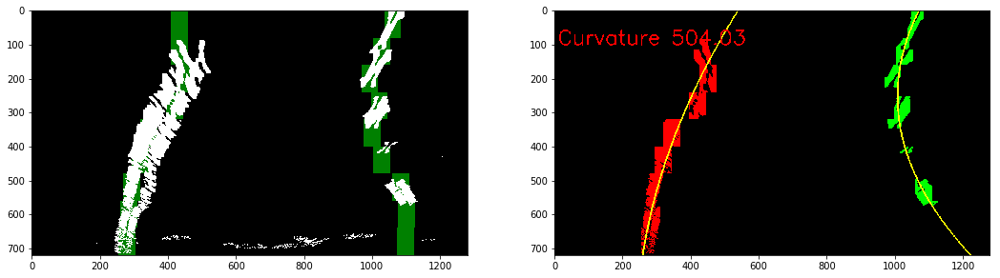

(720,) (720,)
(720,) (720,)
(720,) (1440,)
Final Result


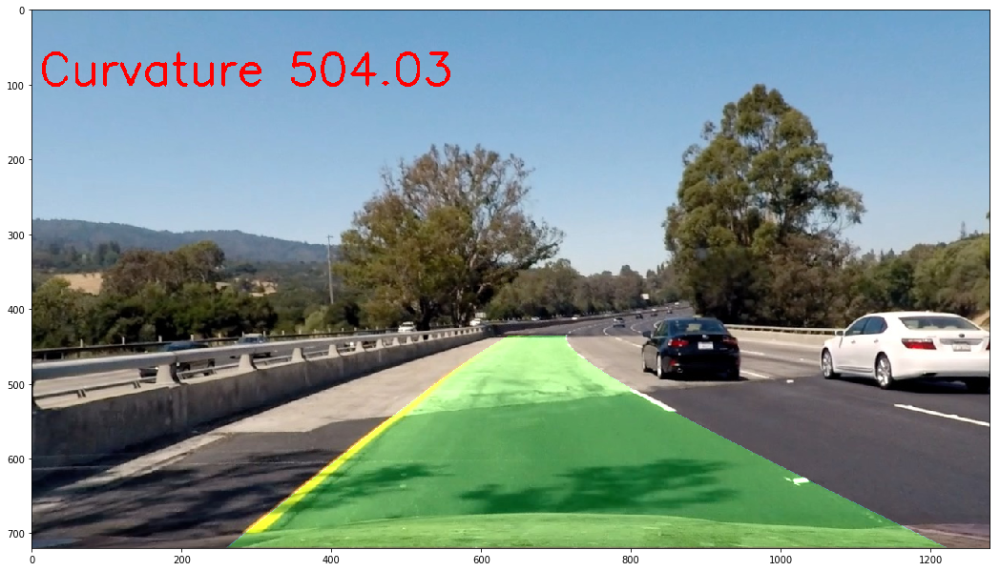

Masked Image and perspective transform (rectification)
Histogram Analysis
(720,) (720,)
(720,) (720,)
Sliding window search results
(720,) (720,)
(720,) (720,)
(720,) (1440,)
Final Result
Masked Image and perspective transform (rectification)
Histogram Analysis
(720,) (720,)
(720,) (720,)
Sliding window search results
(720,) (720,)
(720,) (720,)
(720,) (1440,)
Final Result


In [126]:
import pickle
import scipy.misc
import sys

# camera calibration
with open(CAMERA_CALIB_FILE, 'rb') as f:
    camera_calibration_data = pickle.load(f)
    
# save camera matrix and distortion coeffs from dictionary
mtx = camera_calibration_data['matrix']
dist = camera_calibration_data['distortion']
    
# test images
images = glob.glob('test_images/straight*.jpg') + glob.glob('test_images/test*.jpg') 


#print (images)

PLT_INDICES = [1,2,3,4,5]

undistorted = []
for idx, fname in enumerate(images):
    # undistort
    img = cv2.imread(fname)
    img_undist = cv2.undistort(img, mtx, dist, None, mtx)

    
    if idx in PLT_INDICES:
        print ("Image Undistortion")
        plt.rcParams['figure.figsize'] = (10,10)
        #fig = plt.Figure(figsize=(12,10))
        #print ("Image Undistortion example")
        plt.subplot(121)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.subplot(122)
        plt.imshow(cv2.cvtColor(img_undist, cv2.COLOR_BGR2RGB))
        plt.show()
    
    # convert to HLS color space
    hls = cv2.cvtColor(img_undist, cv2.COLOR_RGB2HLS)
    
    # separate channels
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    
    # plot
    if idx in PLT_INDICES:
        print ("HLS Separation")
        plt.subplot(131)
        plt.gray()
        plt.imshow(H)
        plt.subplot(132)
        plt.imshow(L)
        plt.subplot(133)
        plt.imshow(S)
        plt.show()
    
    # S seems like a good choice, so select this image for further processing 
    
    St = color_threshold(S, (120, 255))
    
    sobel_abs = abs_sobel_threshold(St, sobel_kernel = 5, thresh=(80,255))
    gradient_magn = mag_threshold(St, sobel_kernel= 5, thresh=(80, 255))
    gradient_dir = dir_threshold(St, sobel_kernel = 7, thresh=(0.7, 1.3))
    combined = combine_binary_or(sobel_abs, gradient_dir)
    
    
    if idx in PLT_INDICES:
        print ("Sobel, Gradient Magn and Gradient Dir and combined", idx)
        plt.Figure(figsize=(18,12))
        plt.rcParams['figure.figsize'] = (18,14)

        plt.subplot(141)
        plt.imshow(sobel_abs)
        plt.subplot(142)
        plt.imshow(gradient_magn)
        plt.subplot(143)
        plt.imshow(gradient_dir)
        plt.subplot(144)
        plt.imshow(combined)
        plt.show()
        
        # save for further examination
        fname = "processed_image_" + str(idx) + ".png"
        scipy.misc.imsave(fname, combined*255)
    
    # define masking vertices and mask image
    imshape = combined.shape
    vertices = np.array([[(194,imshape[0]),(586, 436), (732, 436), (1204,imshape[0])]], dtype=np.int32)
    masked = region_of_interest(combined, vertices )
    
    h,w = masked.shape
    
    #print ("Masked shape", h, w)
    
    src_points = np.float32(vertices)
    dst_points = np.float32([[192, 720], [192, 0], [1204, 0], [1204,720]])
    
    #print(dst_points)
    
    M = cv2.getPerspectiveTransform(src_points, dst_points)
    M_inv = cv2.getPerspectiveTransform(dst_points, src_points)
    
    ############
    ###########  DEBUG: 3 channel image to test perspective transform
#     masked_vis = cv2.merge((masked*255, masked*255, masked*255))
    
#     masked_vis = cv2.polylines(masked_vis, vertices, 0, (255,0,0), thickness=4)
    
#     plt.imshow(masked_vis)
#     plt.show()
    
#     rectified = cv2.warpPerspective(masked, M, (w,h), flags=cv2.INTER_LINEAR)
    
#     masked_vis_warp = cv2.warpPerspective(masked_vis, M, (w,h), flags=cv2.INTER_LINEAR)
    
#     plt.imshow(masked_vis_warp)
#     plt.show()
#     sys.exit(0)
    #########
    #########
    
    rectified = cv2.warpPerspective(masked, M, (w,h), flags=cv2.INTER_LINEAR)
    
    print ("Masked Image and perspective transform (rectification)")
    if idx in PLT_INDICES:
        #plt.rcParams['figure.figsize'] = (8,6)
        plt.rcParams['figure.figsize'] = (18,14)
        plt.subplot(131)
        plt.imshow(masked)
        plt.subplot(132)
        plt.imshow(rectified)
        plt.subplot(133)
        plt.imshow(S)
        plt.show()
        
    
    # histogram analysis
    print ("Histogram Analysis")
    #histogram = np.sum(rectified[rectified.shape[0]//2:,:], axis=0)
    #if idx in PLT_INDICES:
    #    plt.plot(histogram)
    #    plt.show()
        
    # Create a 3-channel output image to draw on and  visualize the result
    #out_img = np.dstack((rectified, rectified, rectified))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    #midpoint = np.int(histogram.shape[0]/2)
    #leftx_base = np.argmax(histogram[:midpoint])
    #rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    #print("leftx_base", leftx_base, "rightx_base", rightx_base)
    
    output, filtered_l, filtered_r, window_centroids = sliding_window_search(rectified)
    
    
    ### compount image of left/right pixels
    
    # get polynomial coordinate tuples
    poly_coords_l, curve_rad_l = fit_poly(filtered_l)
    poly_coords_r, curve_rad_r  = fit_poly(filtered_r)
    
    
    ### fit polynomials on left and right lane lines

    filtered_vis = np.array(cv2.merge((filtered_l*255, filtered_r*255, np.zeros_like(filtered_l))), np.uint8)
    
    filtered_vis = draw_poly(filtered_vis, poly_coords_l)
    filtered_vis = draw_poly(filtered_vis, poly_coords_r)
    
    
    
        
    ### select from which side to determine curvature 
    ### (we want to choose the side with more white pixels in the bottom 50 pixels of the image)
    
    left_pixels_ct = np.count_nonzero(filtered_l[-50:,:])
    right_pixels_ct = np.count_nonzero(filtered_r[-50:,:])
    
    if left_pixels_ct > right_pixels_ct:
        curvature_rad = curve_rad_l
    else:
        curvature_rad = curve_rad_r
        
    curvature_txt = "Curvature %.2f" % (curvature_rad)
    cv2.putText(filtered_vis, curvature_txt, (10,100), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,0,0),4)
        
    print("Sliding window search results")
    if idx in PLT_INDICES:
        plt.rcParams['figure.figsize'] = (18,14)
        plt.subplot(121)
        plt.imshow(output)
        plt.subplot(122)
        plt.imshow(filtered_vis)
        plt.show()
        
    ## drawing found lane lines back original image 
    
    rectified_zero = np.zeros_like(rectified).astype(np.uint8)
    color_warp = np.dstack((rectified_zero, rectified_zero, rectified_zero))
    
    # draw lines
    color_warp = draw_poly(color_warp, poly_coords_l)
    color_warp = draw_poly(color_warp, poly_coords_r)
    
    # fill area between lines
    color_warp = draw_poly_filled(color_warp, poly_coords_l, poly_coords_r)
    
    # project image back to camera-space
    color_unwarp = cv2.warpPerspective(color_warp, M_inv, (rectified.shape[1], rectified.shape[0]))
    
    visualization = cv2.addWeighted(img_undist, 1, color_unwarp, 0.3,0)
    cv2.putText(visualization, curvature_txt, (10,100), cv2.FONT_HERSHEY_SIMPLEX, 2, (0,0,255),4)

    
    print ("Final Result")
    if idx in PLT_INDICES:
        plt.imshow(cv2.cvtColor(visualization, cv2.COLOR_BGR2RGB))
        plt.show()
    


## Video Processing Pipeline

In [1]:
import skvideo


ImportError: No module named 'skvideo'